# Ocean eddy tracking SATELLITE

In [1]:
# Importing all libraries.
from pylab import *
from netCDF4 import Dataset
%matplotlib inline
import os
import cmocean as cm
from trackeddy.tracking import *
from trackeddy.datastruct import *
from trackeddy.geometryfunc import *
from trackeddy.init import *
from trackeddy.physics import *
from trackeddy.plotfunc import *

In [2]:
# Import SSHa satellite.
ncfile=Dataset('/home/156/jm5970/github/trackeddy/data.input/dataset_aviso.nc')
ssha=squeeze(ncfile.variables['sla'][:])
# Import geographic coordinates (Lon,Lat)
lon=ncfile.variables['longitude'][:]
lat=ncfile.variables['latitude'][:]

In [3]:
ssha.shape

(31, 720, 1440)

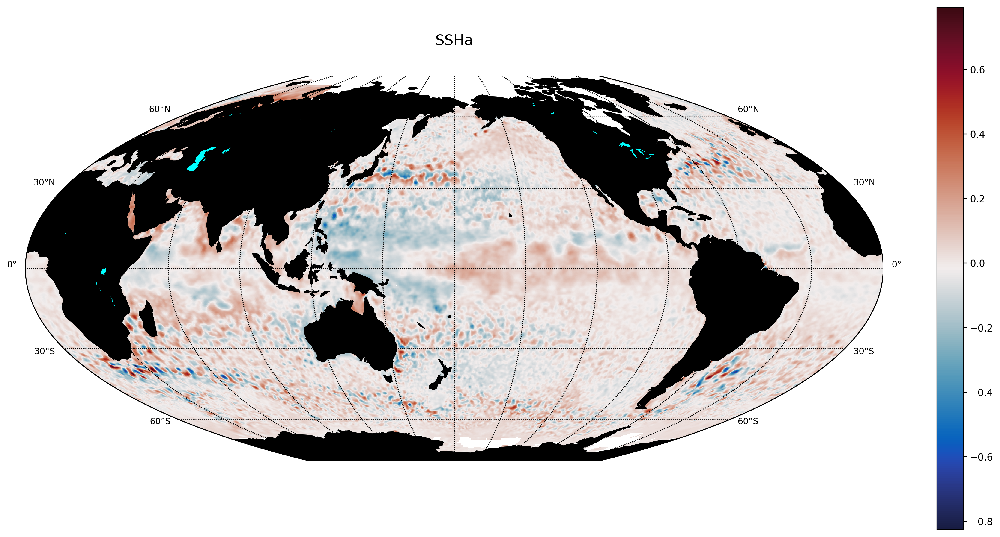

In [4]:
basemap_mplot(lon,lat,ssha[0,:,:],title="SSHa",projection='mbtfpq',lat_0=-90,lon_0=-180,\
              resolution='c',scale='Lin',vmin='',vmax='',cmap=cm.cm.balance,xan=1,yan=1,\
              figsize=(20,10),fontsize=15)
colorbar()

(<matplotlib.figure.Figure at 0x7f36fbc5df98>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f36fbc9e400>,
       dtype=object))

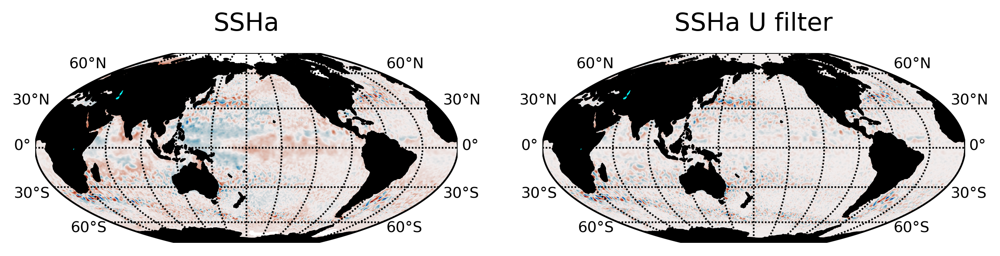

In [5]:
#Area in indexes, probably in the future it will be added an option for lon - lat coords.

#500:1500,0:300

nofilterdata=ssha[0,:,:]
nofilterdata=nofilterdata.filled(fill_value=0)
nofilterdata = nofilterdata - ndimage.uniform_filter(nofilterdata, size=30)
#data = ma.masked_array(nofilterdata, mask)
basemap_mplot(lon,lat,[ssha[0,:,:],nofilterdata],title=["SSHa","SSHa U filter"]\
              ,projection='mbtfpq',lat_0=-90,lon_0=-180,scale='Lin',cmap=cm.cm.balance\
              ,vmin='',vmax='',xan=2,yan=1,figsize=(10,5),fontsize=15,dpi=300)

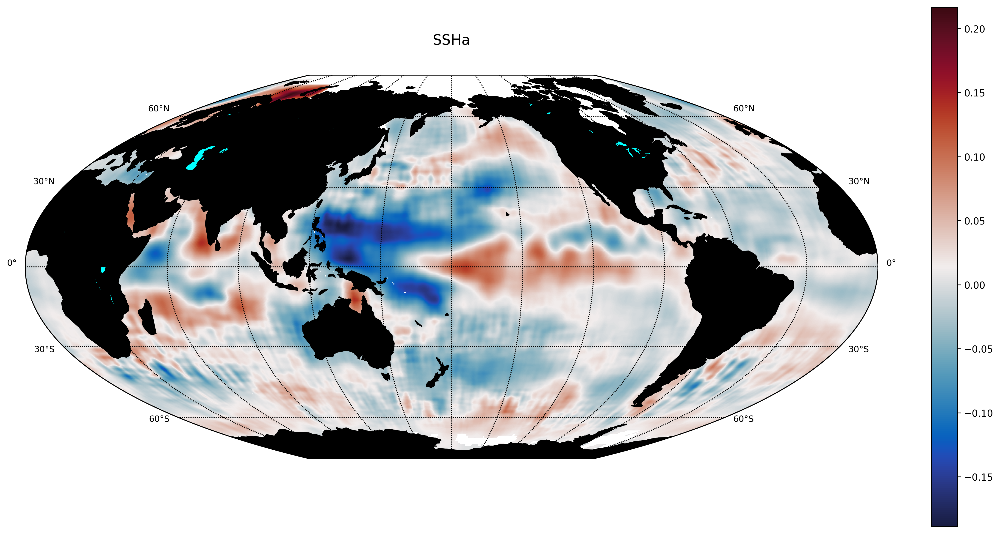

In [6]:
basemap_mplot(lon,lat,ssha[0,:,:]-nofilterdata,title="SSHa",projection='mbtfpq',lat_0=-90,lon_0=-180,\
              resolution='c',scale='Lin',vmin='',vmax='',cmap=cm.cm.balance,xan=1,yan=1,\
              figsize=(20,10),fontsize=15)
colorbar()

In [7]:
#Area in indexes, probably in the future it will be added an option for lon - lat coords.
#areamap=array([[0,int(len(lon)/10)],[0,int(len(lat)/3)]])
areamap=array([[0,len(lon)],[0,len(lat)]])
#areamap=array([[650,800],[200,400]])

In [8]:
eddytd=analyseddyzt(ssha[:,:,:],lon,lat,0,1,1,0.9,0.1,0.01,data_meant='',areamap=areamap,mask=''\
                     ,eccenfit=0.95,gaussrsquarefit=0.9,ellipsrsquarefit=0.95\
                     ,maskopt='contour',sfilter='uniform',sfsize=30\
                     ,destdir='',physics='',diagnostics=False,plotdata=False,pprint=False)

 0% [>]100% Time Elapsed: 80 s  Number of contours analysed: 977 


In [9]:
eddysplot=reconstruct_syntetic(shape(ssha),lon,lat,eddytd)

In [10]:
eddytdn=analyseddyzt(ssha[:,:,:],lon,lat,0,1,1,-0.9,-0.1,-.01,data_meant='',areamap=areamap,mask=''\
                     ,eccenfit=0.95,gaussrsquarefit=0.9,ellipsrsquarefit=0.95\
                     ,maskopt='contour',sfilter='uniform',sfsize=30\
                     ,destdir='',physics='',diagnostics=False,pprint=False)

 0% [>]100% Time Elapsed: 94 s  Number of contours analysed: 988 


In [11]:
eddysplotn=reconstruct_syntetic(shape(ssha),lon,lat,eddytdn)

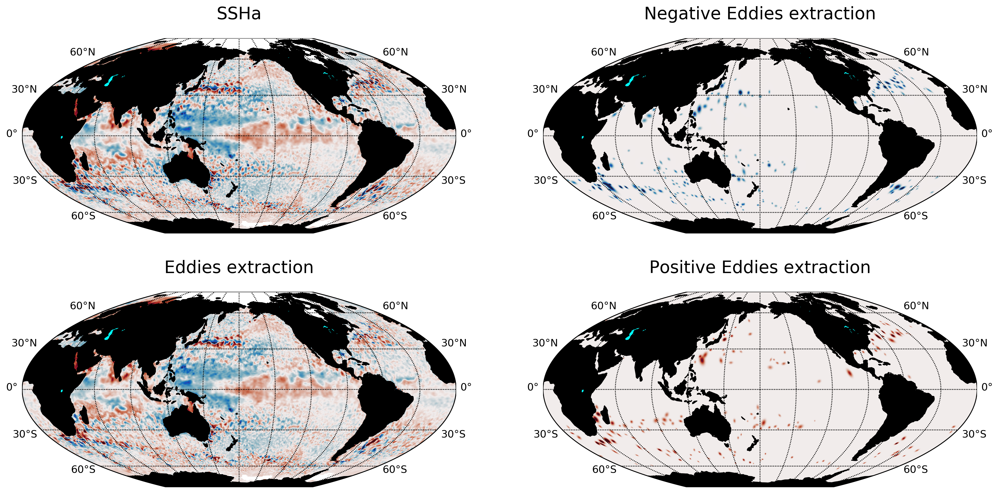

In [12]:
basemap_mplot(lon,lat,[ssha[0,:,:],ssha[0,:,:]-eddysplot[0,:,:]-eddysplotn[0,:,:],eddysplotn[0,:,:],eddysplot[0,:,:]]\
              ,title=["SSHa","Eddies extraction","Negative Eddies extraction","Positive Eddies extraction"]\
              ,projection='mbtfpq',lat_0=-90,lon_0=-180,scale='Lin',cmap=cm.cm.balance,\
              vmin=-.40,vmax=.40,xan=2,yan=2,figsize=(20,10),fontsize=20);

In [13]:
mask=ma.getmask(ssha[0,:,:])

In [14]:
u_g,v_g=geovelfield(ssha[0,:,:],lon,lat,mask,5)
plt.pcolormesh(u_g,vmin=0,vmax=0.1)
print(nanmax(u_g),nanmax(v_g))

NameError: name 'ws' is not defined

In [ ]:
eddyu,eddyv=geovelfield(eddysplotn[0,:,:]+eddysplot[0,:,:],lon,lat,mask,5)

In [ ]:
ke=KE(u_g,v_g)
eke=KE(eddyu,eddyv)
bjke=ke-eke#KE(u_g-eddyu,v_g-eddyv)


print(mean(ke),mean(bjke),mean(eke))

In [ ]:
eu,ev=geovelfield(nofilterdata,lon,lat,mask,5)

In [ ]:
eeke=KE(eu,ev)
mean(eeke)

In [ ]:
basemap_mplot(lon,lat,[ke,bjke,eke]\
              ,title=["KE","B&J KE","EKE"],scale='Lin',cmap=cm.cm.tempo,\
              projection='mbtfpq',lat_0=-90,lon_0=-180,vmin=0,vmax=0.2,xan=3,yan=1,figsize=(20,30),fontsize=20);

In [ ]:
basemap_mplot(lon,lat,ke-eke\
              ,title="KE",scale='Lin',cmap=cm.cm.tempo,\
              projection='mbtfpq',lat_0=-90,lon_0=-180,vmin=0,vmax=0.2,xan=1,yan=1,figsize=(20,10),fontsize=20);
colorbar()

In [ ]:
u_g=zeros(shape(ssha))
v_g=zeros(shape(ssha))
for ii in range(30):
    u_g[ii,:,:],v_g[ii,:,:]=geovelfield(ssha[ii,:,:],lon,lat,mask)

In [ ]:
threshold=3
eddysup=exeddydt(eddytd,lat,lon,u_g,threshold,inside=ssha[:,:,:],diagnostics=False)
eddysun=exeddydt(eddytdn,lat,lon,u_g,threshold,inside=ssha[:,:,:],diagnostics=False)

In [ ]:
threshold=3
eddysvp=exeddydt(eddytd,lat,lon,v_g,threshold,inside=ssha[:,:,:],diagnostics=False)
eddysvn=exeddydt(eddytdn,lat,lon,v_g,threshold,inside=ssha[:,:,:],diagnostics=False)

In [ ]:
eddyu=(eddysun+eddysup)
eddyv=(eddysvn+eddysvp)

In [ ]:
###Creating animation of KE
eke =zeros(shape(eddyu))
print(shape(eke))
for ii in range(30):
    eke[ii,:,:]=KE(eddyu[ii,:,:],eddyv[ii,:,:])
    bjke=KE(u_g[ii,:,:]-eddyu[ii,:,:],v_g[ii,:,:]-eddyv[ii,:,:])
    ke=KE(u_g[ii,:,:],v_g[ii,:,:])

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
import matplotlib.animation as animation
from matplotlib import rc
rc('animation', html='html5')
############################
#Create the figure

fig = plt.figure(figsize=(15, 10),facecolor='white')
gs = gridspec.GridSpec(1, 1)

#############################

ax1 = plt.subplot(gs[0,0])

lonmm,latmm=np.meshgrid(lon,lat)
#############################
#Plot the background and other things, This will be in all the frames
map = Basemap(projection='mbtfpq',lat_0=-90,lon_0=-180,resolution='c',ax=ax1)
lonm,latm=map(lonmm,latmm)
map.drawmeridians(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.drawparallels(np.arange(0,360,30),labels=[1,1,0,0],fontsize=10)
map.fillcontinents(color='black',lake_color='aqua')
map.drawcoastlines()
map.drawcoastlines()
quad1 = ax1.pcolormesh(lonm,latm,eke[0,:,:],shading='gouraud',cmap=cm.cm.tempo,\
              vmin=0,vmax=0.2)
cb1 = fig.colorbar(quad1,ax=ax1)
##############################

##############################
#Intitial stage blank
def init():
    quad1.set_array([])
    return quad1
##############################

##############################
#Animation function, replace the values of the eke in a '1d list'
def animate(iter):
    quad1.set_array(eke[iter,:,:].ravel())
    return quad1
##############################

##############################
#Remove edges
gs.tight_layout(fig)
##############################

##############################
#Animation structure
anim2 = animation.FuncAnimation(fig,animate,frames=30,interval=1000,blit=False,repeat=False)
##############################
plt.close()
##############################
#Display and convert animation to html5
anim2



In [ ]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

In [ ]:
##############################
#Save animation
anim2.save('../output/eke_30days_ecc0-08_1axis.mp4', writer=writer)

In [ ]:
import xarray as xr
ncfile=xr.open_dataset('/home/156/jm5970/github/trackeddy/data.input/meanssh_10yrs_AEXP.nc',decode_times=False)

In [ ]:
ncfile.SSH_mean.plot()